# Run LIANA & MOFA

## Setup Env

In [1]:
import os, fnmatch

import numpy as np
import pandas as pd

import scanpy as sc
import squidpy as sq

In [2]:
import liana as li
from liana.method.sp import lr_basis, basis

In [3]:
import decoupler as dc
import seaborn as sns

In [4]:
data_dir = "/home/dbdimitrov/Repos/liana2_manuscript/data/kidney_injury/"

## TODO:

- Append LR hotspots to mdatas
- Append NMF factor scores to mdatas

-> Chapter 5 Basis

## Load Processed Objects

### Load Visium

In [5]:
## TODO tangram seems to change the type of the matrix -> should just join the deconvolution results & pass all of this as mudata
# slides : fnmatch.filter(os.listdir(os.path.join(data_dir, 'visium', 'deconv']], '*.h5ad']
slides = fnmatch.filter(os.listdir(os.path.join(data_dir, 'visium')), '*.h5ad')

In [6]:
adatas = dict()
for slide in slides:
    sample = slide[:-5].split('_')[0]
    print(sample)
    # adatas[slide] = sc.read_h5ad(os.path.join(data_dir, 'visium', 'deconv', slide]]
    adatas[sample] = sc.read_h5ad(os.path.join(data_dir, "visium", slide))
    adatas[sample].obs['sample'] = sample
    

f6wks
f12hr
f4hr
fsham
f2dps


## Run LIANA

In [7]:
lrdatas = dict()
for sample in adatas.keys():
    adata = adatas[sample].copy()
    
    # TODO convert this to np.float32 internally
    sq.gr.spatial_neighbors(adata, n_rings=1, coord_type="grid", n_neighs=6)
    
    lr_basis(adata,
            function_name="jaccard",
            expr_prop=0.1,
            resource_name="MouseConsensus", 
            pvalue_method=None, 
            use_raw=False, 
            #  positive_only:True,
            proximity_key="spatial_connectivities",
    )
    # extract the local scores
    lrdatas[sample]=li.fun.obsm_to_adata(adata, 'local_scores')


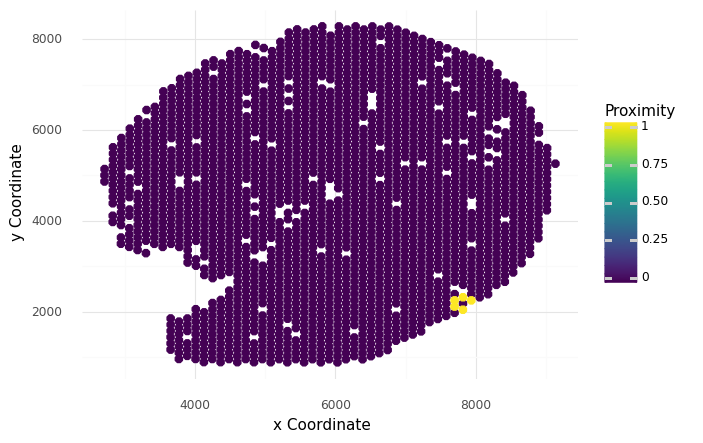

<ggplot: (8776273316786)>

In [11]:
## TODO flip coordinates
li.pl.proximity_plot(adata, idx=1, spatial_key='spatial', proximity_key='spatial_connectivities')

In [8]:
lrdata = lrdatas['f6wks']

In [10]:
lrdata

AnnData object with n_obs × n_vars = 1514 × 841
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    uns: 'log1p', 'spatial', 'spatial_neighbors', 'global_res'
    obsm: 'spatial', 'local_scores'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [11]:
adata.uns['global_res'].sort_values('global_mean').tail(10)

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,interaction,global_mean,global_sd
174,Tgm2,Itgb1,1.062551,0.847393,1.238781,0.862085,Tgm2&Itgb1,0.780537,0.245009
1113,Spp1,Itgav_Itgb1,5.205983,1.000000,0.987975,0.802844,Spp1&Itgav_Itgb1,0.805632,0.243830
2334,Timp1,Cd63,1.136890,0.811848,2.720397,0.994787,Timp1&Cd63,0.813973,0.246151
197,Tgm2,Sdc4,1.062551,0.847393,1.554439,0.931280,Tgm2&Sdc4,0.819289,0.205409
507,App,Aplp2,1.451256,0.928436,1.149898,0.877725,App&Aplp2,0.856303,0.182598
1157,Mfge8,Itgav,1.465557,0.923697,1.351061,0.903791,Mfge8&Itgav,0.861919,0.202380
506,H2-K1,Aplp2,1.565722,0.951659,1.149898,0.877725,H2-K1&Aplp2,0.864321,0.177198
154,Lgals1,Itgb1,2.485018,0.984360,1.238781,0.862085,Lgals1&Itgb1,0.864415,0.194182
1154,Calr,Itgav,2.238762,0.986256,1.351061,0.903791,Calr&Itgav,0.902828,0.170304
530,App,Rpsa,1.451256,0.928436,3.547689,0.999526,App&Rpsa,0.929566,0.127791


In [12]:
# save results as modalities
local_lr = li.fun.obsm_to_adata(adata, 'local_scores')
# local_pvals = li.fun.obsm_to_adata(adata, 'local_pvals']

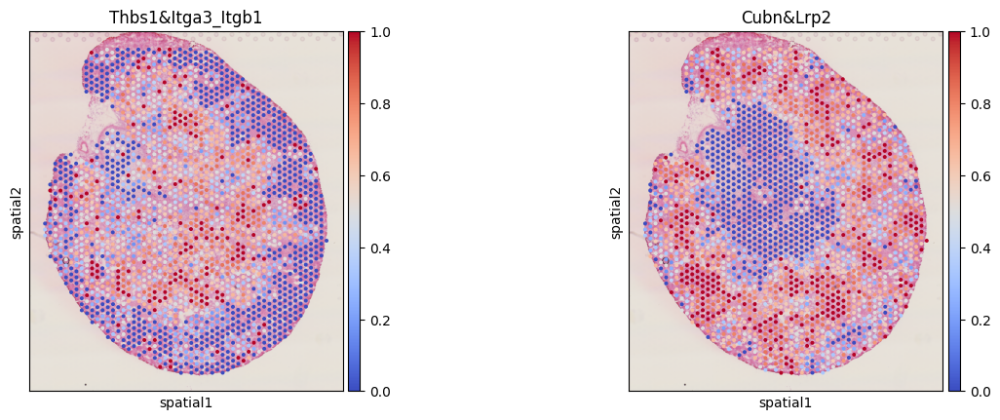

In [13]:
sc.pl.spatial(local_lr, color=['Thbs1&Itga3_Itgb1', 'Cubn&Lrp2'], cmap='coolwarm')

## Run NMF on the whole Dataset

In [14]:
from sklearn.decomposition import NMF

In [15]:
lrdata_all = sc.concat(lrdatas, join='outer', fill_value=0)

In [16]:
lrdata_all

AnnData object with n_obs × n_vars = 8753 × 941
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    obsm: 'spatial', 'local_scores'

In [17]:
# Create an instance of the NMF class
model = NMF(n_components=8, init='random', random_state=0)

# Fit the model to the data and obtain the factorized matrices
W = model.fit_transform(lrdata_all.X)
H = model.components_

/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.


In [18]:
 ## NOTE take index from adata.obs.index, not from the obsm matrix
columns = [f"Factor{i+1}" for i in range(W.shape[1])]
lrdata_all.obsm['NMF_W'] = pd.DataFrame(W, index=lrdata_all.obs.index, columns=columns)
lrdata_all.varm['NMF_H'] = H.T # NOTE I don't convert to dataframe, because it does not get filtered

In [19]:
for sample in lrdatas:
    # each
    lrdata = lrdatas[sample]
    
    # Get the NMF factors for the current sample from the full dataset
    temp = lrdata_all[lrdata_all.obs.index.isin(lrdata.obs.index), :]
    temp = temp[:, temp.var.index.isin(lrdata.var.index)]
    
    lrdata.obsm['NMF_W'] = temp.obsm['NMF_W']
    lrdata.varm['NMF_H'] = temp.varm['NMF_H']

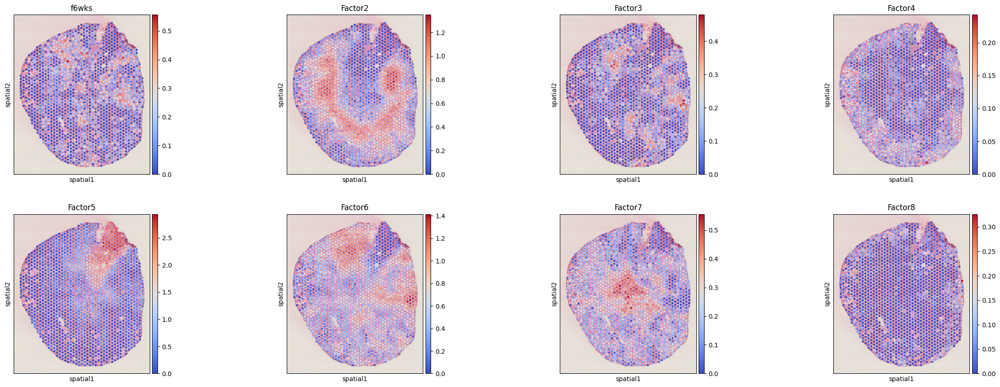

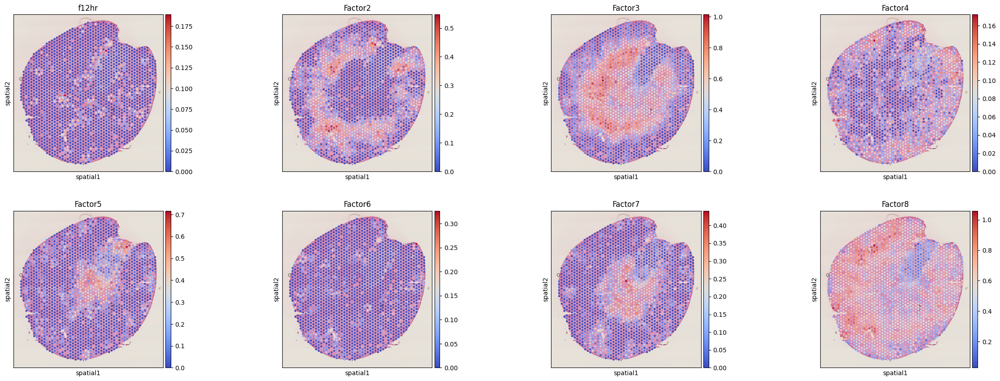

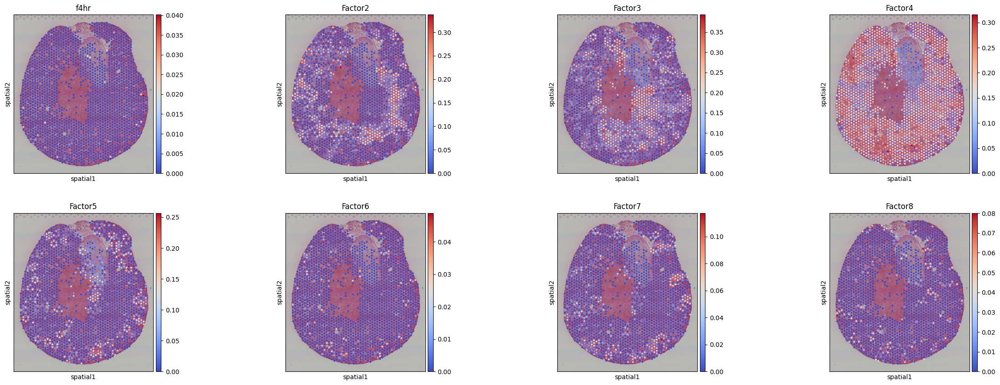

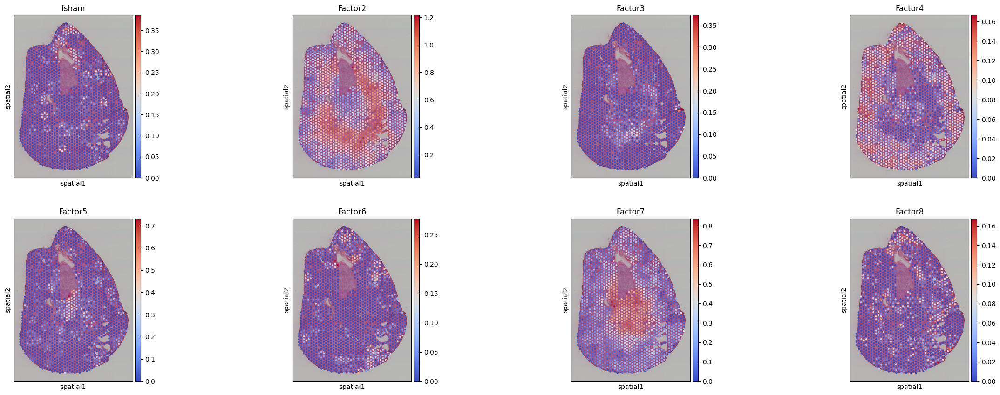

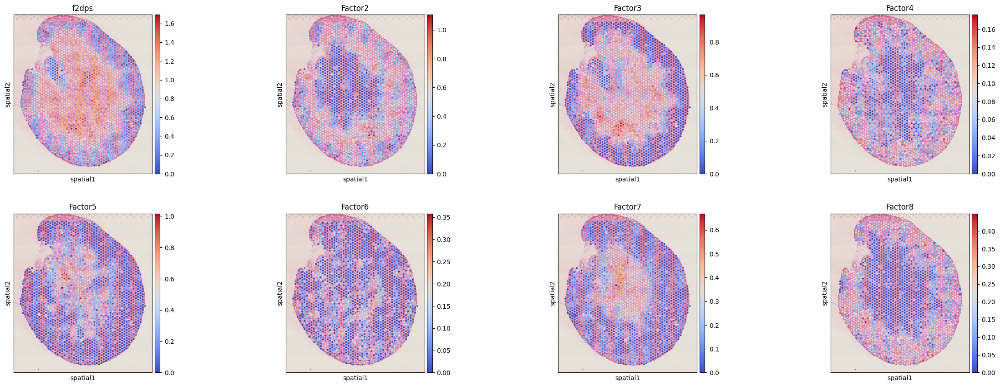

In [20]:
for sample in lrdatas.keys():
    ad_nmf = li.fun.obsm_to_adata(lrdatas[sample], 'NMF_W')
    sc.pl.spatial(ad_nmf, color=lrdata.obsm['NMF_W'].columns, cmap='coolwarm', title=sample)

## Pathway Enrichment on Ligand-Receptor Factor Loadings

In [21]:
lrdata = lrdatas['f6wks']

In [22]:
lr_loadings = pd.DataFrame(lrdata_all.varm['NMF_H'], index=lrdata_all.var.index, columns=columns)

In [23]:
lr_loadings

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8
interaction,,,,,,,,
Ace&Bdkrb2,0.000000,0.000000,0.029979,0.000000,0.000000,0.000000,0.000000,0.093336
Actr2&Ldlr,0.096955,0.077602,0.095696,0.000000,0.148152,0.038402,0.181929,0.224193
Actr2&Lrp2,0.093968,0.510464,0.264305,0.897294,0.000000,0.224563,0.069470,0.458239
Ada&Dpp4,0.077196,0.005622,0.000000,0.000000,0.000000,0.000000,0.000000,0.002854
Adam10&Axl,0.280871,0.070701,0.269408,0.361873,0.135536,0.361883,0.224714,0.202093
...,...,...,...,...,...,...,...,...
Wnt7b&Fzd4_Lrp6,0.067542,0.000000,0.000000,0.000000,0.084997,0.015792,0.292279,0.000000
Wnt7b&Tmed5,0.042444,0.000000,0.392925,0.163352,0.135096,0.000000,0.259677,0.000000
Wnt9b&Fzd1_Lrp6,0.000000,0.000000,0.000000,0.000000,0.072645,0.021134,0.000000,0.000000


In [24]:
# load PROGENy pathways
net = dc.get_progeny(organism='Mus musculus', top=5000)

# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('mouseconsensus')

# generate ligand-receptor geneset
lr_progeny = li.fun.generate_lr_geneset(lr_pairs, net, lr_separator="&") # NOTE I should change & to & in basis for consistency
lr_progeny.head()

/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


,source,interaction,weight
1,EGFR,Dll1&Notch1,-1.000584
31,EGFR,Adam10&Notch1,-0.924934
37,MAPK,Adam10&Notch1,-0.925038
58,WNT,Tnf&Notch1,-1.513049
98,WNT,Adam17&Notch1,-0.951469


In [26]:
estimate, pvals = dc.run_mlm(lr_loadings.transpose(), lr_progeny, source="source", target="interaction", use_raw=False)

In [27]:
estimate

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
Factor1,-2.967810,1.290659,-0.570130,0.055547,-0.860457,-1.868912,-0.268615,-1.189457,8.816846,-0.847744,-2.008852,-1.084130,-1.083526,0.015066
Factor2,0.932350,0.029370,-2.644140,0.302717,0.300304,0.420808,-0.705734,-1.335965,1.760750,-0.367818,-0.212983,-0.443522,0.267641,0.555550
Factor3,-2.352810,3.802757,-0.918037,1.290488,-0.640955,2.076924,0.990287,0.324142,5.641040,0.285965,-0.676923,1.728577,-0.964725,0.804160
Factor4,-0.075361,-0.020662,-1.978930,1.722769,-0.592314,0.882140,0.231741,-1.582064,0.368527,-0.519057,-1.107970,-0.592737,-0.629802,1.368287
Factor5,-1.091803,1.328942,-1.474910,2.260094,-0.524955,-3.551768,-0.393779,-3.742351,1.202478,-0.257710,-2.394310,-0.732351,0.153872,1.108464
Factor6,-2.818564,-0.362090,-0.630504,-1.283056,-0.274686,-2.355930,0.222791,0.069938,6.175410,0.533097,-0.733899,-1.911826,-1.832811,1.978108
Factor7,1.024504,0.534414,-2.624029,0.643025,-0.827588,-0.847203,0.302937,-3.934807,3.218689,-1.545331,-1.587480,0.719970,0.455765,0.567815
Factor8,0.025747,-0.417658,-1.332203,4.305155,-0.738985,1.264141,-0.554924,-1.950431,1.263008,-0.231871,-0.750812,-0.012613,-2.100803,1.031524


<AxesSubplot:>

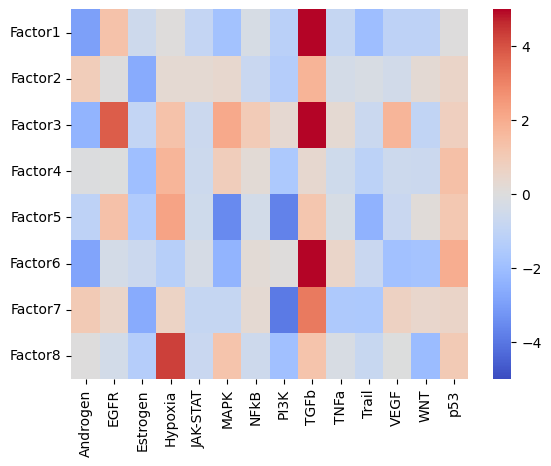

In [28]:
sns.heatmap(estimate, cmap='coolwarm', center=0, vmin=-5, vmax=5)

## Create MuDatas

## Basis

In [ ]:
# load map of genes to cytosig signatures
cytosig_map = pd.read_csv('../cytosig_map.csv', index_col=0)
cytosig_map = cytosig_map.reset_index(names='source')
# Translate targets
cytosig_map = dc.translate_net(cytosig_map, target_organism = 'mouse', columns=['target'])
cytosig_map.head()

## Run MOFAcell

In [33]:
from mudata import MuData
import muon as mu
import mofax as mofa

In [34]:
adata = sc.concat(adatas=adatas)
adata.obs['leiden'] = adata.obs['leiden'].replace({'5':'2'})

In [35]:
mdata = li.multi.adata_to_views(adata,
                                groupby='leiden',
                                sample_key='sample',
                                obs_keys=None,
                                min_prop=0.05, # min nnz values (filter features]
                                min_smpls=3, # min samples per view (filter features]
                                min_cells=25, # min cells per view (filter samples]
                                min_counts=100, # min counts per view (filter samples]
                                mode='sum', # mode of aggregation
                                verbose=True,
                                skip_checks=True,
                                layer='counts'
                                )

100%|██████████| 5/5 [00:01<00:00,  4.82it/s]


In [36]:
for mod in mdata.mod.keys():
    sc.pp.normalize_total(mdata.mod[mod], target_sum=1e4)
    sc.pp.log1p(mdata.mod[mod])
    
    sc.pp.highly_variable_genes(mdata.mod[mod], min_mean=0.0125, max_mean=3, min_disp=0.5)

In [37]:
model = mu.tl.mofa(mdata, 
                   use_obs='union',
                   convergence_mode='medium',
                   outfile="models/mofacell.hdf5",
                   n_factors=4,
                   use_var='highly_variable'
                   )


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
Loaded view='4' group='group1' with N=5 samples and D=7741 features...
Loaded view='1' group='group1' with N=5 samples and D=9674 features...
Loaded view='3' group='group1' with N=5 samples and D=10690 features...
Loaded view='2' group='group1' with N=5 samples and D=10097 features...
Loaded view='0' group='group1' with N=5 samples and D=8821 features...


Model options:
- Autom

In [38]:
# obtain factor scores
factor_scores = li.multi.get_factor_scores(mdata, obsm_key='X_mofa')
factor_scores.head(]

SyntaxError: closing parenthesis ']' does not match opening parenthesis '(' (3900559239.py, line 3)

In [ ]:
model = mofa.mofa_model("models/mofacell.hdf5")
model

In [ ]:
mofa.plot_r2(model, x='View')

In [ ]:
model.close()

## Run MOFAtalk

In [40]:
lrdata.obs['group'] = lrdata.obs['sample'].str.split('_').str[0]

In [41]:
mdata = li.multi.adata_to_views(lrdata,
                                groupby='leiden',
                                sample_key='sample',
                                obs_keys=['group'],
                                min_prop=0.05, # min nnz values (filter features]
                                min_smpls=3, # min samples per view (filter features]
                                min_cells=25, # min cells per view (filter samples]
                                min_counts=0, # min counts per view (filter samples]
                                mode='mean', # mode of aggregation
                                verbose=True,
                                skip_checks=True
                                )

100%|██████████| 6/6 [00:00<00:00, 43.29it/s]


In [42]:
mdata

MuData object with n_obs × n_vars = 1 × 4917
  obs:	'group'
  6 modalities
    4:	1 x 799
      layers:	'psbulk_props'
    1:	1 x 817
      layers:	'psbulk_props'
    3:	1 x 840
      layers:	'psbulk_props'
    2:	1 x 835
      layers:	'psbulk_props'
    0:	1 x 807
      layers:	'psbulk_props'
    5:	1 x 819
      layers:	'psbulk_props'

In [47]:
model = mu.tl.mofa(mdata, 
                   use_obs='union',
                   convergence_mode='medium',
                   outfile="models/lrs.h5ad",
                   n_factors=4
                   )


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
Loaded view='4' group='group1' with N=1 samples and D=799 features...
Loaded view='1' group='group1' with N=1 samples and D=817 features...
Loaded view='3' group='group1' with N=1 samples and D=840 features...
Loaded view='2' group='group1' with N=1 samples and D=835 features...
Loaded view='0' group='group1' with N=1 samples and D=807 features...
Loaded view='5' group='group1' 

ValueError: n_components=4 must be between 0 and min(n_samples, n_features)=1 with svd_solver='full'

In [48]:
# obtain factor scores
factor_scores = li.multi.get_factor_scores(mdata, obsm_key='X_mofa')
factor_scores.head()


ValueError: X_mofa not found in mdata.obsm

In [49]:
model = mofa.mofa_model("models/lrs.h5ad")
model

MOFA+ model: lrs.h5ad
Samples (cells): 5
Features: 3071
Groups: group1 (5)
Views: 0 (542), 1 (540), 2 (553), 3 (550), 4 (425), 5 (461)
Factors: 5
Expectations: W, Z

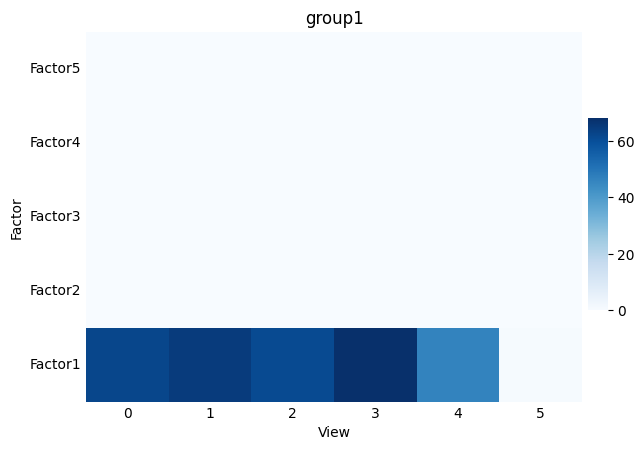

In [50]:
mofa.plot_r2(model, x='View')

In [51]:
factor1_loadings =  li.multi.get_variable_loadings(mdata, 0, view_separator=':') # get loadings for factor 1
## NOTE this should work, not only with 0...

KeyError: 'LFs'

In [52]:
factor1_loadings.head(10)

NameError: name 'factor1_loadings' is not defined